In [1]:
import scanpy as sc, numpy as np, pandas as pd
import pymde
import torch
from harmony import harmonize
import matplotlib.pyplot as plt

In [2]:
adata_merged = sc.read_h5ad('./adata_merged.250501.h5ad')

In [3]:
adata_merged.obsm['X_harmony'] = harmonize(adata_merged.obsm['X_scvi'],
                                        adata_merged.obs, batch_key = ['pool','background'], use_gpu=True, max_iter_harmony=200,
                                        theta=1, ridge_lambda=0.1
                                       )


Use GPU mode.
	Initialization is completed.
	Completed 1 / 200 iteration(s).
	Completed 2 / 200 iteration(s).
Reach convergence after 2 iteration(s).


In [4]:
sorted([s for s in adata_merged.obs['sample'].unique()])

['BRM014-E',
 'BRM014-E4T',
 'Ctrl-0.5E',
 'Ctrl-0.5ET',
 'Ctrl-E.p1',
 'Ctrl-E.p6',
 'Ctrl-ET.p1',
 'Ctrl-ET.p6',
 'Ctrl-hPSC.p1',
 'H1-0.5E',
 'H1-0.5E4T',
 'H1-0.5ET',
 'H1-E',
 'H1-E4T.1',
 'H1-E4T.2',
 'H1-E4T.3',
 'H1-ET',
 'H1-hPSC.p6',
 'H1-hPSC.p8',
 'JARID2-E',
 'JARID2-E4T',
 'JARID2-ET',
 'JARID2-hPSC',
 'SMARCC1-E',
 'SMARCC1-E4T',
 'SMARCC1-ET',
 'SMARCC1-hPSC']

In [5]:
reference_sample_list = [
 'Ctrl-0.5E',
 'Ctrl-0.5ET',
 'Ctrl-E.p1',
 'Ctrl-E.p6',
 'Ctrl-ET.p1',
 'Ctrl-ET.p6',
 'Ctrl-hPSC.p1',
 'H1-0.5E', 
 'H1-0.5ET',
 'H1-E',
 'H1-ET',
 'H1-hPSC.p6',
]    


In [6]:
adata_refs = adata_merged[adata_merged.obs['sample'].isin(reference_sample_list)].copy()

In [7]:
sc.pp.neighbors(adata_refs, n_neighbors=30, use_rep='X_harmony')
sc.tl.leiden(adata_refs, resolution=0.3, key_added='hmy0.3', flavor='igraph', n_iterations=2)
sc.tl.leiden(adata_refs, resolution=0.5, key_added='hmy0.5', flavor='igraph', n_iterations=2)
sc.tl.leiden(adata_refs, resolution=0.7, key_added='hmy0.7', flavor='igraph', n_iterations=2)
sc.tl.leiden(adata_refs, resolution=1.0, key_added='hmy1.0', flavor='igraph', n_iterations=2)

2025-05-05 09:14:24.517396: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-05 09:14:25.498410: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746461665.752196   30166 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746461665.841679   30166 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1746461666.341118   30166 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [8]:
import pymde
embedder = pymde.preserve_neighbors(adata_refs.obsm['X_harmony'], verbose=False, device='cuda', repulsive_fraction=0.15)
adata_refs.obsm['X_mde'] =  embedder.embed(verbose=False, max_iter=3000).detach().cpu().numpy()

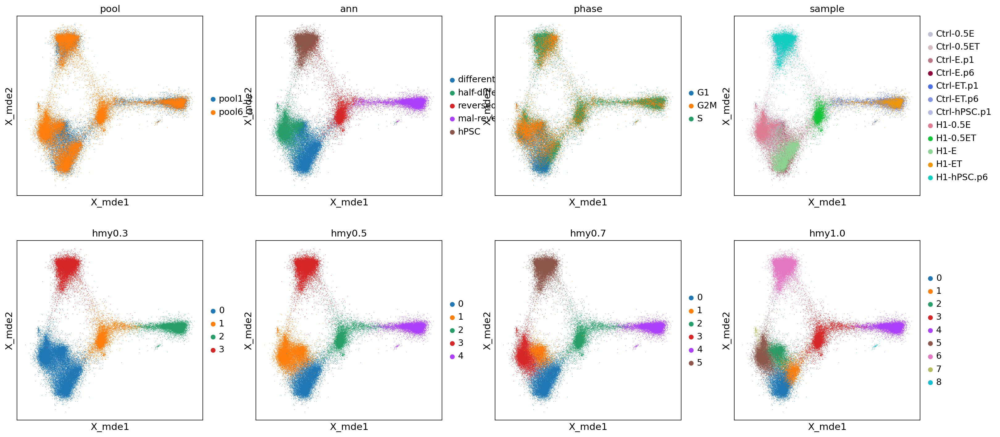

In [9]:
sc.set_figure_params(figsize=[5,5])
sc.pl.embedding(adata_refs, basis='X_mde', 
                color=['pool','ann','phase','sample', 'hmy0.3','hmy0.5','hmy0.7','hmy1.0'])


In [ ]:
#adata_refs.write_h5ad('./adata_refs.250505.h5ad')

In [10]:
import pymde, torch
pymde.seed(19940929)

Z_ref = adata_refs.obsm['X_harmony'].copy()

DEV = torch.device('cuda:0')

ref_embedder  = pymde.preserve_neighbors(data= Z_ref, embedding_dim=2, device='cuda', repulsive_fraction=0.15)

X_ref = ref_embedder.embed(verbose=False,max_iter=3000).detach().cpu().numpy()

anchor_constraint = pymde.Anchored(
    anchors=torch.arange(Z_ref.shape[0]).to(DEV),
    values=ref_embedder.X,
)

In [11]:
adata_refs.obsm['X_mde'] =X_ref.copy()

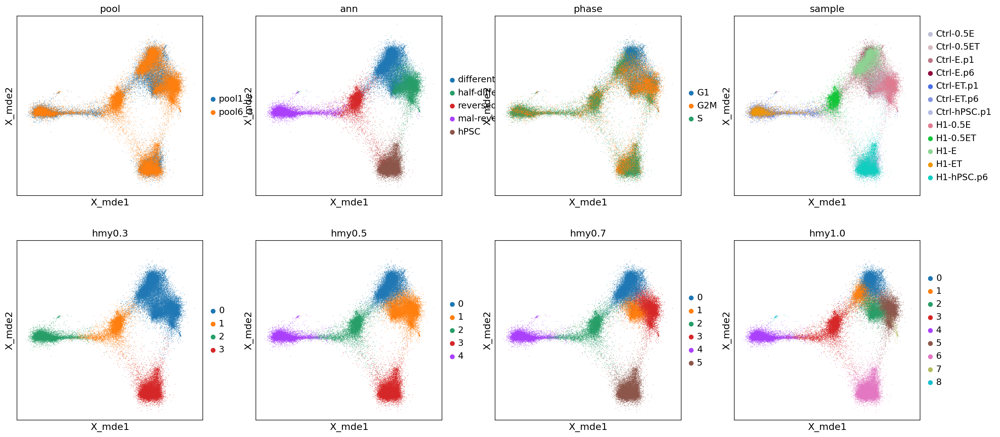

In [12]:
sc.set_figure_params(figsize=[5,5])
sc.pl.embedding(adata_refs, basis='X_mde', 
                color=['pool','ann','phase','sample', 'hmy0.3','hmy0.5','hmy0.7','hmy1.0'])


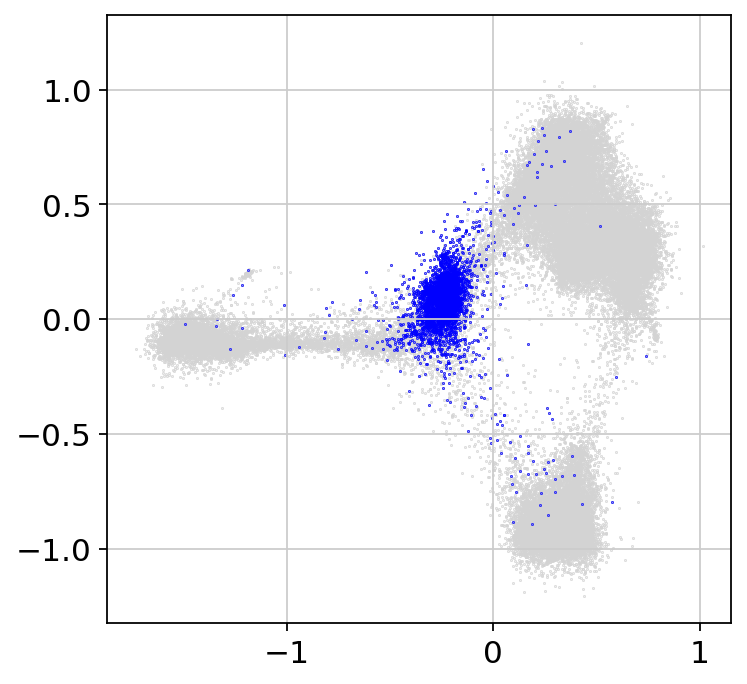

In [13]:
plt.scatter(*adata_refs.obsm['X_mde'].T, c='lightgray', s=0.1)

adata_sub = adata_refs[adata_refs.obs['sample'] =='H1-0.5ET']
plt.scatter(*adata_sub.obsm['X_mde'].T, c='blue', s=0.1)

In [14]:
query_sample_list = [ sample for sample in adata_merged.obs['sample'].unique() if sample not in reference_sample_list ]
query_sample_list

['JARID2-E',
 'JARID2-ET',
 'JARID2-hPSC',
 'H1-0.5E4T',
 'H1-E4T.1',
 'H1-E4T.2',
 'H1-E4T.3',
 'JARID2-E4T',
 'SMARCC1-E4T',
 'BRM014-E4T',
 'BRM014-E',
 'SMARCC1-E',
 'SMARCC1-ET',
 'H1-hPSC.p8',
 'SMARCC1-hPSC']

In [15]:
from scipy.stats import gaussian_kde
def get_density(points):
    return gaussian_kde(points.T)(points.T)

In [16]:
query_dict = {}
for query_sample in query_sample_list:
    print(f'computing embeddings for {query_sample}')
    adata_sub = adata_merged[ adata_merged.obs['sample'] == query_sample ] .copy()
    Z_query   = adata_sub.obsm['X_harmony'].copy()
    Z_cat     = torch.from_numpy(np.concatenate([Z_ref, Z_query], axis=0)).to(DEV)
    
    cat_embedder = pymde.preserve_neighbors(Z_cat, constraint=anchor_constraint, init='random', device='cuda', verbose=False)
    X_cat = cat_embedder.embed(verbose=False, max_iter=3000).detach().cpu().numpy()
    
    X_query = X_cat[ X_ref.shape[0]: , ]
    adata_sub.obsm['X_mde'] = X_query.copy()
    query_dict[query_sample] = adata_sub.copy()

computing embeddings for JARID2-E
computing embeddings for JARID2-ET
computing embeddings for JARID2-hPSC
computing embeddings for H1-0.5E4T
computing embeddings for H1-E4T.1
computing embeddings for H1-E4T.2
computing embeddings for H1-E4T.3
computing embeddings for JARID2-E4T
computing embeddings for SMARCC1-E4T
computing embeddings for BRM014-E4T
computing embeddings for BRM014-E
computing embeddings for SMARCC1-E
computing embeddings for SMARCC1-ET
computing embeddings for H1-hPSC.p8
computing embeddings for SMARCC1-hPSC


In [17]:
import anndata
adata_merged2 = anndata.concat( [adata_refs]+ list(query_dict.values()) )

In [18]:
sc.pp.neighbors(adata_merged2, use_rep='X_mde', n_neighbors=10)
sc.tl.diffmap(adata_merged2, n_comps=5)

In [19]:
adata_merged2.obsm['X_dmap'] = adata_merged2.obsm['X_diffmap'][:, 1:3]

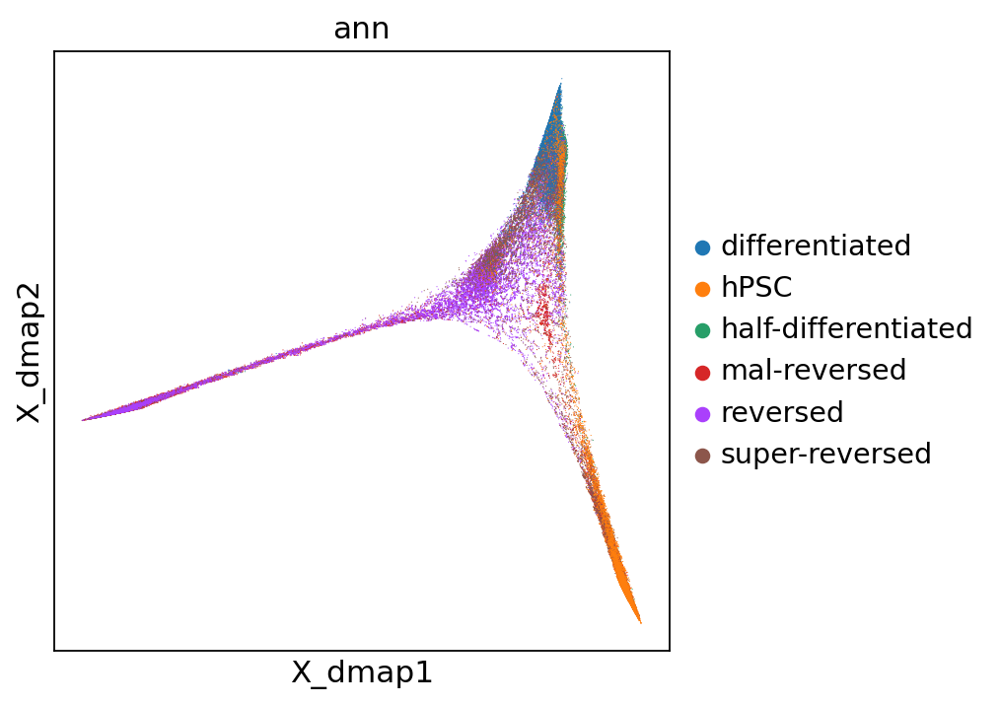

In [25]:
sc.pl.embedding(adata_merged2, basis='X_dmap', color ='ann')

In [103]:
adata_merged2.write_h5ad('./adata_merged.250505-canonical.h5ad')

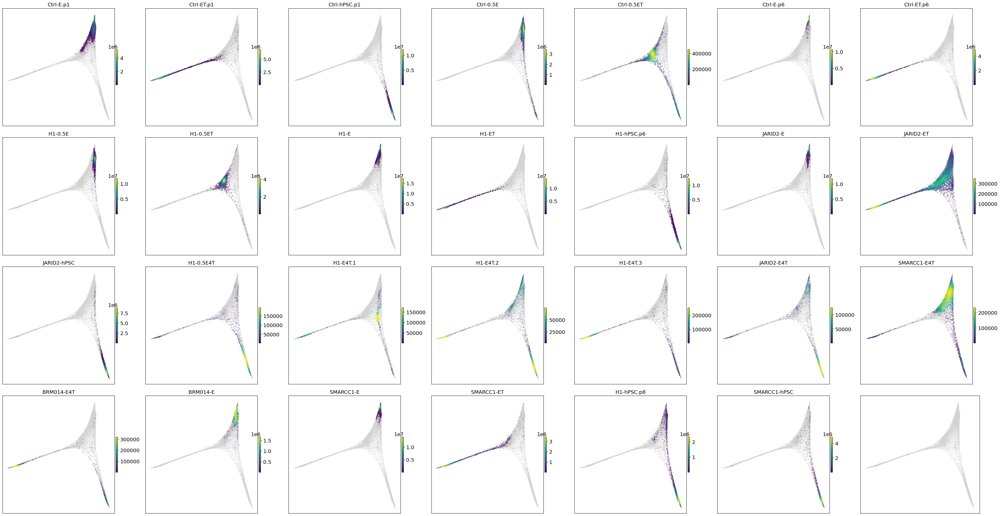

In [26]:
sample_list = adata_merged2.obs['sample'].unique()
NROWS, NCOLS = 4, 7
fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(NCOLS * 5.5, NROWS * 5))
all_pts = adata_merged2.obsm['X_dmap']

for row in axes:
    for ax in row:
        ax.scatter(*all_pts.T, s=0.01, c='lightgray')
        ax.grid(False);ax.set_xticks([]);ax.set_yticks([])

for i, sample_name in enumerate(sample_list):
    sel = (adata_merged2.obs['sample'] == sample_name)
    adata_sub = adata_merged2[sel]
    sub_pts = adata_sub.obsm['X_dmap']
    density = gaussian_kde(sub_pts.T)(sub_pts.T)
    loc = (i // NCOLS, i % NCOLS)
    scs = axes[loc].scatter(*sub_pts.T, s=0.1, c=density, alpha=1, rasterized=True)
    fig.colorbar(scs, ax=axes[loc], shrink=0.3, fraction=0.05, pad=0.01)
    axes[loc].set_title(sample_name )

plt.tight_layout()
plt.savefig("RefQry-Diffmap-sample-distributions.v250505-2.png", dpi=300)
plt.show()

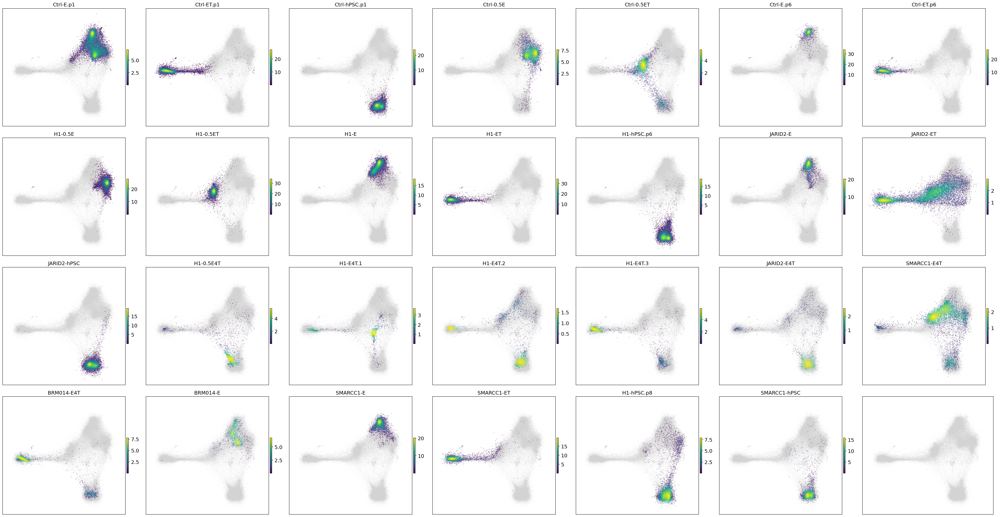

In [22]:
sample_list = adata_merged2.obs['sample'].unique()
NROWS, NCOLS = 4, 7
fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(NCOLS * 5.5, NROWS * 5))
all_pts = adata_merged2.obsm['X_mde']

for row in axes:
    for ax in row:
        ax.scatter(*all_pts.T, s=0.01, c='lightgray')
        ax.grid(False);ax.set_xticks([]);ax.set_yticks([])

for i, sample_name in enumerate(sample_list):
    sel = (adata_merged2.obs['sample'] == sample_name)
    adata_sub = adata_merged2[sel]
    sub_pts = adata_sub.obsm['X_mde']
    density = gaussian_kde(sub_pts.T)(sub_pts.T)
    loc = (i // NCOLS, i % NCOLS)
    scs = axes[loc].scatter(*sub_pts.T, s=0.1, c=density, alpha=1, rasterized=True)
    fig.colorbar(scs, ax=axes[loc], shrink=0.3, fraction=0.05, pad=0.01)
    axes[loc].set_title(sample_name )

plt.tight_layout()
plt.savefig("RefQry-MDE-sample-distributions.v250505-2.png", dpi=300)
plt.show()

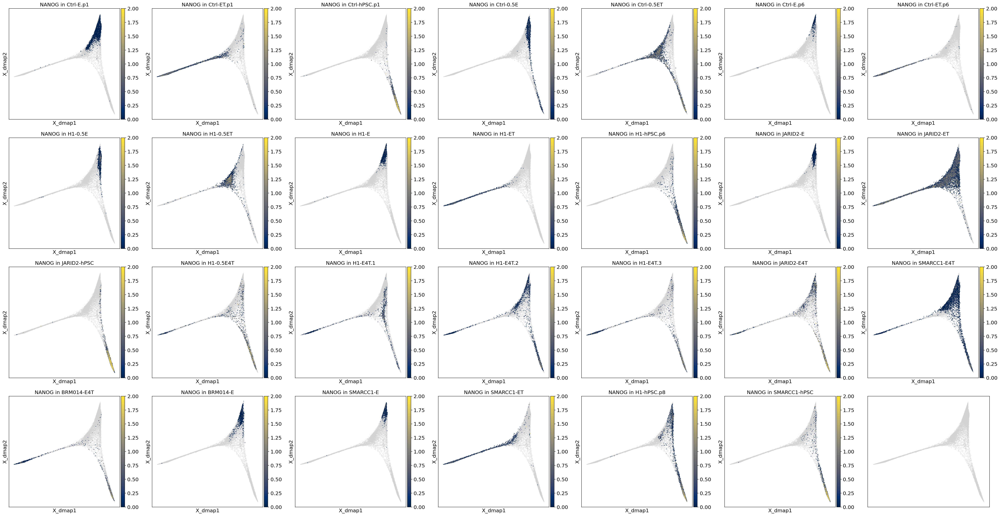

In [100]:
NROWS, NCOLS = 4, 7
fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(NCOLS * 5.5, NROWS * 5))
all_pts = adata_merged2.obsm['X_dmap']

for row in axes:
    for ax in row:
        ax.scatter(*all_pts.T, s=0.01, c='lightgray')
        ax.grid(False);ax.set_xticks([]);ax.set_yticks([])

for i, sample_name in enumerate(sample_list):
    sel = (adata_merged2.obs['sample'] == sample_name)
    adata_sub = adata_merged2[sel]
    loc = (i // NCOLS, i % NCOLS)
    sc.pl.embedding(adata_sub, basis='X_dmap', color='NANOG', ax=axes[loc], show=False, cmap='cividis', title='NANOG in '+sample_name,sort_order=True,vmin=0,vmax=2.0, size=10)
    
for ax in axes.flat:
    for coll in ax.collections:
        coll.set_rasterized(True)

    
plt.tight_layout()
plt.savefig("RefQry-Diffmap-sample-NANOG.v250505-2.png", dpi=300)
plt.show()

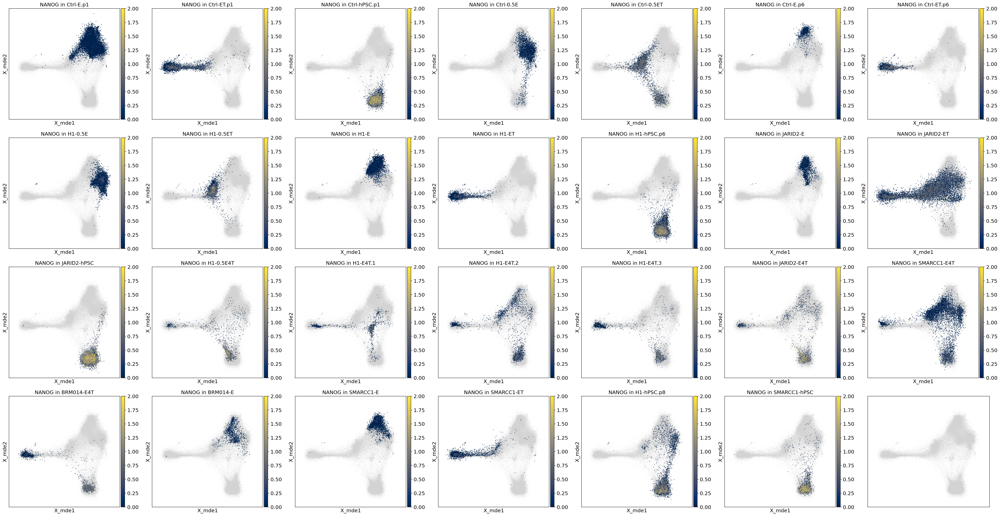

In [99]:
NROWS, NCOLS = 4, 7
fig, axes = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(NCOLS * 5.5, NROWS * 5))
all_pts = adata_merged2.obsm['X_mde']

for row in axes:
    for ax in row:
        ax.scatter(*all_pts.T, s=0.01, c='lightgray')
        ax.grid(False);ax.set_xticks([]);ax.set_yticks([])

for i, sample_name in enumerate(sample_list):
    sel = (adata_merged2.obs['sample'] == sample_name)
    adata_sub = adata_merged2[sel]
    loc = (i // NCOLS, i % NCOLS)
    sc.pl.embedding(adata_sub, basis='X_mde', color='NANOG', ax=axes[loc], show=False, cmap='cividis', title='NANOG in '+sample_name,sort_order=True,vmin=0,vmax=2.0, size=10)
    
for ax in axes.flat:
    for coll in ax.collections:
        coll.set_rasterized(True)

    
plt.tight_layout()
plt.savefig("RefQry-MDE-sample-NANOG.v250505-2.png", dpi=300)
plt.show()

In [59]:
adata_Ctrl_05EvE = adata_merged2[ adata_merged2.obs['sample'].isin( [ 'Ctrl-0.5E','Ctrl-E.p1' ]) ].copy()
adata_H1_05EvE = adata_merged2[ adata_merged2.obs['sample'].isin( [ 'H1-0.5E','H1-E' ]) ].copy()
sc.tl.rank_genes_groups(adata_Ctrl_05EvE, groupby='sample')
sc.tl.rank_genes_groups(adata_H1_05EvE,   groupby='sample')

In [96]:
def intersect(lst1 , lst2): 
    return [g for g in lst1 if g in lst2]

In [97]:
Up_Ctrl_05E = sc.get.rank_genes_groups_df( adata_Ctrl_05EvE, group='Ctrl-0.5E' ).query('logfoldchanges>0 & pvals_adj<0.05')
Up_H1_05E   = sc.get.rank_genes_groups_df( adata05EvE, group='H1-0.5E' ).query('logfoldchanges>0 & pvals_adj<0.05')

Up_Share_05E = intersect(Up_Ctrl_05E.names.tolist(), Up_H1_05E.names.tolist())

Up_Ctrl_05E = Up_Ctrl_05E[ Up_Ctrl_05E['names'].isin(Up_Share_05E) ].copy()
Up_H1_05E   = Up_H1_05E[ Up_H1_05E['names'].isin(Up_Share_05E) ].copy()

Up_05E_genes = intersect(Up_Ctrl_05E.query('logfoldchanges>2').names.tolist(), Up_H1_05E.query('logfoldchanges>2').names.tolist())

